# **Pip install**

# **Importing Libraries**

In [1]:
import pandas as pd
import yfinance as yf
import numpy as np
from datetime import datetime, timedelta

# **Creating Dataset**

We are getting a dataset from kaggle where we can reach tweets, dates, and author's followers, adding this dataset 1 week later column for later, also making index as date because we are combine this dataset and bitcoin price dataset after.

In [2]:
chunk = pd.read_csv('Bitcoin_tweets.csv',chunksize=10000,lineterminator='\n',low_memory=False)
df = pd.concat(chunk)
df = df[["user_name","user_followers","text","date"]]
df = df.convert_dtypes()
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df = df.dropna(subset=['date'])
df['date'] = df['date'].dt.strftime('%Y-%m-%d')
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df.set_index('date', inplace=True)
df = df.sort_index()
df["1_week_later"] = df.index + timedelta(days=7)
df.shape

(4689288, 4)

# **Filtering**

We use filtering because BRENT cost LOTSSS OF TIME 

In [3]:
df['user_followers'] = pd.to_numeric(df['user_followers'], errors='coerce')

df = df[~df["user_name"].str.contains("binance")]
df = df[~df["user_name"].str.contains("coinbase")]
df = df[~df["user_name"].str.contains("huobi")]
df = df[~df["user_name"].str.contains("kraken")]
df = df[~df["user_name"].str.contains("bitfinex")]
df = df[~df["user_name"].str.contains("okex")]
df = df[~df["user_name"].str.contains("gemini")]
df = df[~df["user_name"].str.contains("kucoin")]
#df = df[df['text'].str.contains('long|short|buy|sell|over|up|down|support|resistance|reversal|breakdown|break|bull|bear|ban|whale|forecast', case=False, regex=True)]
df = df[~df["text"].str.contains("t.co")]

df = df[df['user_followers'] >= 10000]
df.shape

KeyboardInterrupt: 

# **Decleare Start and End Time**

Before getting BTC price dataset, we need to know time interval

In [5]:
start_date = df.index[0]
end_date = df.iloc[-1]["1_week_later"]+ timedelta(days=1)
start_date,end_date

(Timestamp('2021-02-05 00:00:00'), Timestamp('2023-01-17 00:00:00'))

# **Creating Bitcoin Price Dataset**

Also adds another 2 column which are "change" and "result"
Change = 1 week later price - index price
Result = If price goes up, 1 else 0

In [6]:
btc_data = yf.download("BTC-USD",start=start_date, end=end_date)["Adj Close"]
btc_data = pd.DataFrame(btc_data)


btc_data["1_week_later_price"] = btc_data["BTC-USD"].shift(-7)
btc_data["change_percent"] = (btc_data["1_week_later_price"] - btc_data["BTC-USD"]) / btc_data["BTC-USD"] *100
btc_data.index = btc_data.index.date

btc_data


[*********************100%***********************]  1 of 1 completed


Ticker,BTC-USD,1_week_later_price,change_percent
2021-02-05,38144.308594,47504.851562,24.539816
2021-02-06,39266.011719,47105.515625,19.965114
2021-02-07,38903.441406,48717.289062,25.226168
2021-02-08,46196.464844,47945.058594,3.785125
2021-02-09,46481.105469,49199.871094,5.849185
...,...,...,...
2023-01-12,18869.587891,NaN,NaN
2023-01-13,19909.574219,NaN,NaN
2023-01-14,20976.298828,NaN,NaN
2023-01-15,20880.798828,NaN,NaN


# **Merge These 2 Datasets**

In [7]:
merged_data = pd.merge(df, btc_data, how='inner', left_index=True, right_index=True)
merged_data

,user_name,user_followers,text,1_week_later,BTC-USD,1_week_later_price,change_percent
2021-02-05,Macstones,16936.0,“you look like all these btc boys”. What does...,2021-02-12,38144.308594,47504.851562,24.539816
2021-02-05,Bitcoin Archive 🗄🚀🌔,22436.0,Bitcoin is now accepted as payment for flights...,2021-02-12,38144.308594,47504.851562,24.539816
2021-02-05,Bitcoin Archive 🗄🚀🌔,22436.0,Grayscale Bitcoin Trust grew by $15.7b in 2020...,2021-02-12,38144.308594,47504.851562,24.539816
2021-02-05,Bitcoin Archive 🗄🚀🌔,22436.0,Bitcoin is here to stay - Larry Summers Ex...,2021-02-12,38144.308594,47504.851562,24.539816
2021-02-05,Sqwii,13070.0,#Bitcoin close to major breakout over @elonmus...,2021-02-12,38144.308594,47504.851562,24.539816
...,...,...,...,...,...,...,...
2023-01-09,Huayo Canto,15283.0,@sofizamolo Only #BTC for the moment 😎,2023-01-16,17196.554688,21169.632812,23.103919
2023-01-09,Inversiones Pergamino,10107.0,PRE MARKET. 9/1 🇺🇸 #SPX +0.42% 🇺🇸 #NDQ +0.55%...,2023-01-16,17196.554688,21169.632812,23.103919
2023-01-09,Slavik,19095.0,"Robert Kiyosaki says that other than #BTC, the...",2023-01-16,17196.554688,21169.632812,23.103919
2023-01-09,Crypto 🔶️Best_Mood🔶️,10843.0,@AltCryptoGems #BTC To The 100K Soon 💎,2023-01-16,17196.554688,21169.632812,23.103919


# **Cleaning Merged Data**

In [8]:
merged_data = merged_data[["text","change_percent"]]
merged_data

,text,change_percent
2021-02-05,“you look like all these btc boys”. What does...,24.539816
2021-02-05,Bitcoin is now accepted as payment for flights...,24.539816
2021-02-05,Grayscale Bitcoin Trust grew by $15.7b in 2020...,24.539816
2021-02-05,Bitcoin is here to stay - Larry Summers Ex...,24.539816
2021-02-05,#Bitcoin close to major breakout over @elonmus...,24.539816
...,...,...
2023-01-09,@sofizamolo Only #BTC for the moment 😎,23.103919
2023-01-09,PRE MARKET. 9/1 🇺🇸 #SPX +0.42% 🇺🇸 #NDQ +0.55%...,23.103919
2023-01-09,"Robert Kiyosaki says that other than #BTC, the...",23.103919
2023-01-09,@AltCryptoGems #BTC To The 100K Soon 💎,23.103919


# **Check the Distribution**

/var/folders/sq/gm7zfkzn4d39w44wjzbx70x40000gn/T/ipykernel_1393/3366301296.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_data['trend'] = np.where(merged_data['change_percent'] > 0, 'buy', 'sell')


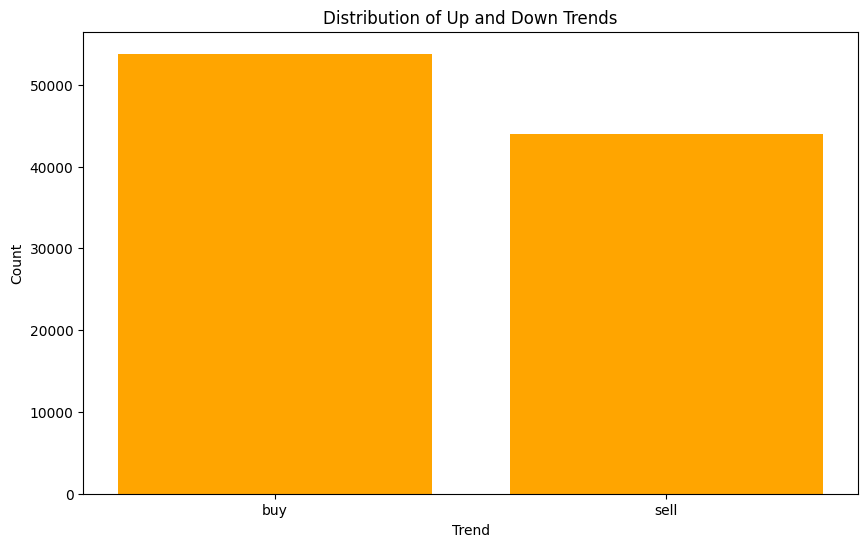

In [9]:
import numpy as np
import matplotlib.pyplot as plt

merged_data['trend'] = np.where(merged_data['change_percent'] > 0, 'buy', 'sell')

trend_counts = merged_data.groupby('trend').size()

labels = trend_counts.index.tolist()
values = trend_counts.values.tolist()

plt.figure(figsize=(10, 6))
plt.bar(labels, values, color='orange')
plt.xlabel('Trend')
plt.ylabel('Count')
plt.title('Distribution of Up and Down Trends')
plt.show()


In [10]:
merged_data

,text,change_percent,trend
2021-02-05,“you look like all these btc boys”. What does...,24.539816,buy
2021-02-05,Bitcoin is now accepted as payment for flights...,24.539816,buy
2021-02-05,Grayscale Bitcoin Trust grew by $15.7b in 2020...,24.539816,buy
2021-02-05,Bitcoin is here to stay - Larry Summers Ex...,24.539816,buy
2021-02-05,#Bitcoin close to major breakout over @elonmus...,24.539816,buy
...,...,...,...
2023-01-09,@sofizamolo Only #BTC for the moment 😎,23.103919,buy
2023-01-09,PRE MARKET. 9/1 🇺🇸 #SPX +0.42% 🇺🇸 #NDQ +0.55%...,23.103919,buy
2023-01-09,"Robert Kiyosaki says that other than #BTC, the...",23.103919,buy
2023-01-09,@AltCryptoGems #BTC To The 100K Soon 💎,23.103919,buy


In [11]:
for tweet in merged_data["text"]:
    print(tweet)

“you look like all these btc boys”. 
What does that even mean ? 😂 
#BTC #Bitcoin
Bitcoin is now accepted as payment for flights, homes and hotels by travel firm Travala - using Binance Pay 🚀

#Bitcoin #BTC
Grayscale Bitcoin Trust grew by $15.7b in 2020
86% came from institutions.

#Bitcoin #BTC
Bitcoin is here to stay 
- Larry Summers 
  Ex-US Treasury Secretary

#Bitcoin #BTC
#Bitcoin close to major breakout over @elonmusk #btc top 38.000 can we do it today? If so big move higher coming
(Uses Crystal Ball) ..... Bitcoin To $80,000 By April? 

#Bitcoin #Btc #Investing #crypto #cryptocurrencynews
#Bitcoin #BTC new ATH this weekend?
Bitcoin just passed $41,000 
and still in stealth mode 🤫 

#Bitcoin #BTC
#Bitcoin new ATH before the #KansasCityChiefs win #SuperBowl 

#cryptocurrency #btc #ETH #Ethereum #crypto
Which one is your favorite coin???
#GAMESTOP #GME #BTC #BITCOIN
@tyler When are you going to learn #btc isn’t #bitcoin even #blockstream know this 🤦‍♀️
In 40k zone again #BTC #Bitco

ChatGPT

In [5]:
import requests
url = "http://localhost:11434/api/generate"

def send_request(tweet):
    payload = {
        "model": "llama3.2",
        "prompt": f"You are a broker bot that only returns 'buy' or 'sell' according to giving tweet about bitcoin, only return 'buy' or 'sell', here is the tweet: {tweet}"
    }

    # POST isteği gönderme
    response = requests.post(url, json=payload)

    # Yanıtı kontrol etme
    if response.status_code == 200:
        print("Yanıt:", response.json())
    else:
        print("Hata:", response.status_code, response.text)


JSONDecodeError: Extra data: line 2 column 1 (char 93)